In [1]:
#cell block 1
#import libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline

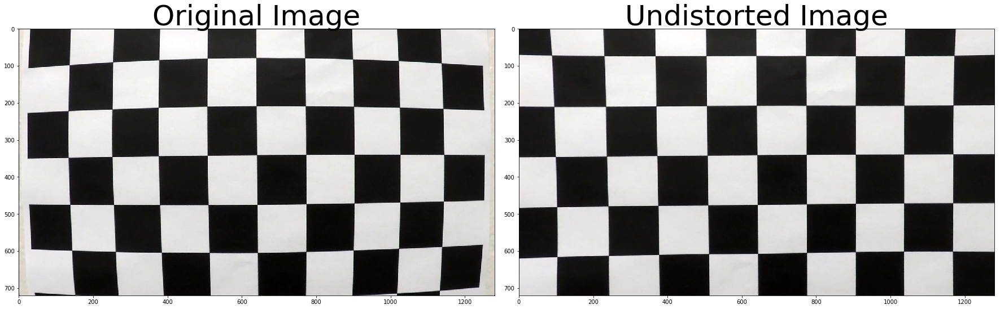

In [2]:
#cell block 2
#define camera calibration functions to get calibration matrix and distortion coeffiecents

#create object point and image points functiom
def get_object_image_points_dir_list(dir_path,nx,ny):
    """
    This function takes a dir path, number of x corners and y corners
    
    Returns a list of image points and object points to calibrate a camera
    """
    objpoints=[]
    imgpoints=[]

    #create standard objpoints
    objp=np.zeros((nx*ny,3),np.float32)
    objp[:,:2]=np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Make a list of calibration images
    dir_list=os.listdir(dir_path)
    for fname in dir_list:
        img = mpimg.imread(dir_path+fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray,(nx,ny), None)
        if ret == True:
            #append obejct points and detected corners if they were found
            objpoints.append(objp)
            imgpoints.append(corners)
    return imgpoints, objpoints    
def cal_undistort(img, mtx, dist):
    return cv2.undistort(img,mtx,dist,None,mtx)

imgpoints, objpoints = get_object_image_points_dir_list("camera_cal/",9,6)
img = mpimg.imread("camera_cal/calibration1.jpg")
ret, mtx, dist, rvecs, tvecs=cv2.calibrateCamera(objpoints,imgpoints,img.shape[0:2],None, None)
undistorted = cal_undistort(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('output_images/undistorted_chessboard.jpg')

/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: divide by zero encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: invalid value encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in greater
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less


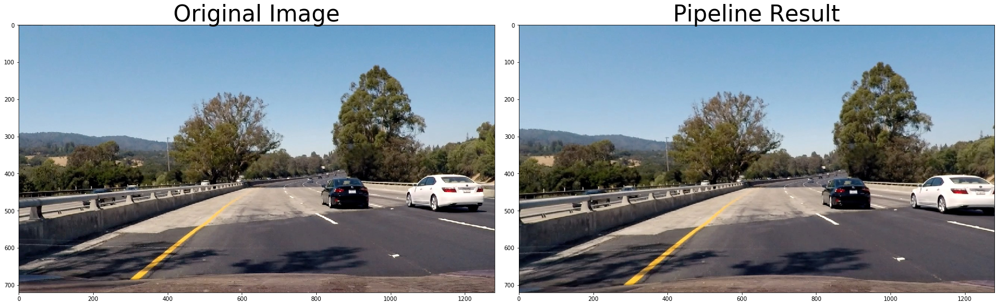

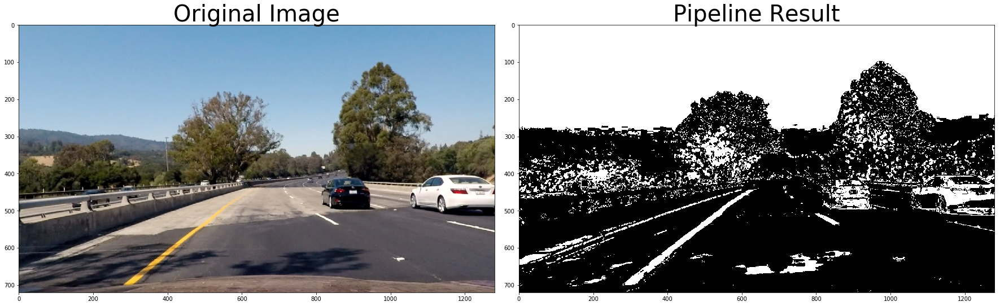

In [3]:
#cell block 3
#test image pipeline
def abs_sobel_thresh(img, orient='x', thresh=(0,255),sobel_kernel=3):
    
    # Apply the following steps to img
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    if orient!="x":
        sobelx=cv2.Sobel(gray, cv2.CV_64F,0,1,ksize=sobel_kernel)
    else:
        sobelx=cv2.Sobel(gray, cv2.CV_64F,1,0,ksize=sobel_kernel)
    abs_sobelx=np.absolute(sobelx)
    scaled_sobelx=np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sxbinary=np.zeros_like(scaled_sobelx,np.float32)
    sxbinary[(scaled_sobelx>=thresh[0])&(scaled_sobelx<=thresh[1])]=1.0
    #Return this mask as your binary_output image
    binary_output = sxbinary
    return binary_output
def mag_threshold(img, sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx=cv2.Sobel(gray, cv2.CV_64F,1,0,ksize=sobel_kernel)
    abs_sobelx=np.absolute(sobelx)
    sobely=cv2.Sobel(gray, cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobely=np.absolute(sobely)
    abs_sobelxy=np.sqrt(abs_sobelx**2+abs_sobely**2)
    scaled_sobelxy=np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    sxybinary=np.zeros_like(scaled_sobelxy,np.float32)
    sxybinary[(scaled_sobelxy>=thresh[0])&(scaled_sobelxy<=thresh[1])]=1.0
    # 6) Return this mask as your binary_output image
    binary_output = sxybinary # Remove this line
    return binary_output
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx=cv2.Sobel(gray, cv2.CV_64F,1,0,ksize=sobel_kernel)
    abs_sobelx=np.absolute(sobelx)
    sobely=cv2.Sobel(gray, cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobely=np.absolute(sobely)
    abs_sobelxy=np.arctan(abs_sobely/abs_sobelx)
    scaled_sobelxy=abs_sobelxy
    sxybinary=np.zeros_like(scaled_sobelxy,np.float32)
    sxybinary[(scaled_sobelxy>thresh[0])&(scaled_sobelxy<thresh[1])]=1.0
    # 6) Return this mask as your binary_output image
    binary_output = sxybinary # Remove this line
    return binary_output

def hls_select(img, thresh=(0, 255),channel=2):
    hls=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    s=hls[:,:,channel]
    binary=np.zeros_like(s,np.float32)
    binary[(s>thresh[0])&(s<=thresh[1])]=1.0
    
    binary_output = binary
    return binary_output

def hsv_select(img, thresh=(0, 255),channel=1):
    hls=cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    s=hls[:,:,channel]
    binary=np.zeros_like(s,np.float32)
    binary[(s>thresh[0])&(s<=thresh[1])]=1.0
    
    binary_output = binary
    return binary_output

def binary_pipeline(img, 
                    l_thresh=(80, 255),
                    s_thresh=(100, 255), 
                    sx_thresh=(20, 120), 
                    sy_thresh=(20, 100), 
                    mag_thresh=(50, 100),
                    dir_thresh=(0.7, 1.3)):
    image = np.copy(img)
    # Convert to HLS color space and separate the S channel
    s_binary = hls_select(image,thresh=s_thresh)
    #l_binary = hls_select(image,thresh=l_thresh,channel=1)
    # Sobel x
    sxbinary=abs_sobel_thresh(image,thresh=sx_thresh, sobel_kernel=9)
    #magnitude gradient
    magbinary= mag_threshold(image,thresh=mag_thresh, sobel_kernel=9)
    #directional gradient
    dirbinary= dir_threshold(image,thresh=dir_thresh, sobel_kernel=9)
    combined_grad = np.zeros_like(magbinary)
    combined_grad[((sxbinary == 1) & (dirbinary == 1))] = 1
    combined_cs = np.zeros_like(magbinary)
    #combined_cs[((s_binary == 1) & (l_binary == 1))] = 1
    combined_cs[((s_binary == 1))] = 1
    color_binary = np.dstack((np.zeros_like(magbinary), combined_grad, combined_cs))
    binary=np.zeros_like(sxbinary)
    binary[(combined_grad==1)|(combined_cs==1)]=1
    return color_binary, binary

def plot_img(img,result,path=None):
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)
    if len(result.shape)==2:
        ax2.imshow(result,cmap="gray")
    else:
        ax2.imshow(result)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if path!=None:
        plt.savefig(path)
dir_path=os.listdir("test_images/")

for fname in dir_path[3:4]:
    img = mpimg.imread("test_images/"+fname)
    undistorted = cal_undistort(img, mtx, dist)
    color_binary,binary=binary_pipeline(undistorted)
    plot_img(img,undistorted,'output_images/undistorted_test6.jpg')
    plot_img(undistorted,binary,'output_images/binary_threshold.jpg')
    

/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: divide by zero encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: invalid value encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in greater
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less


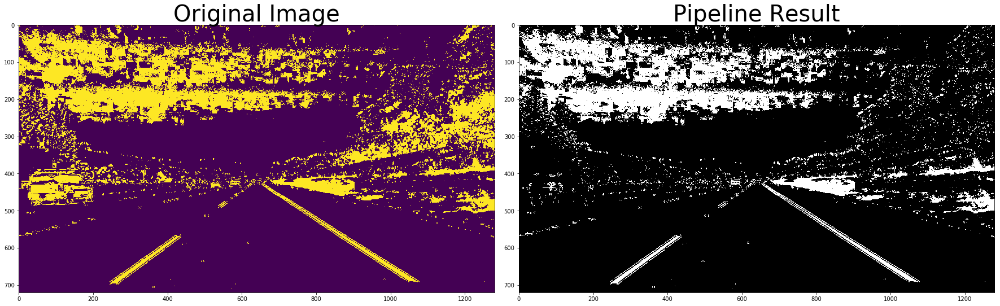

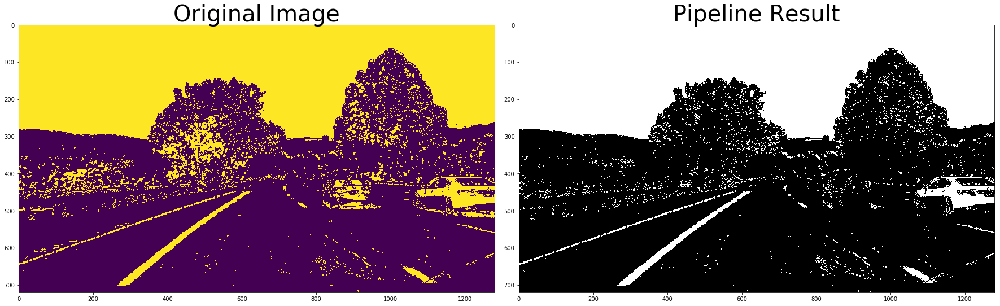

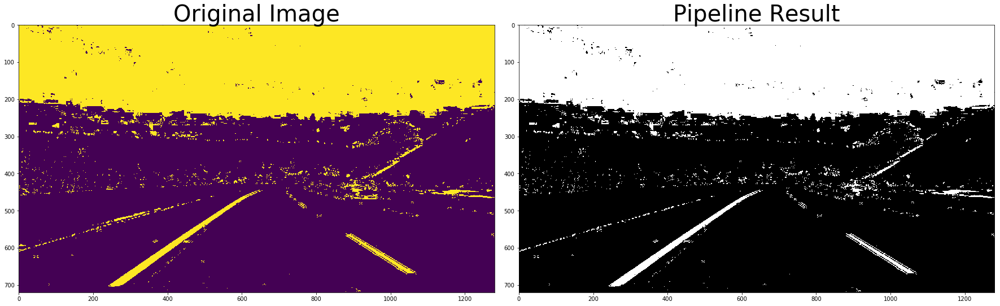

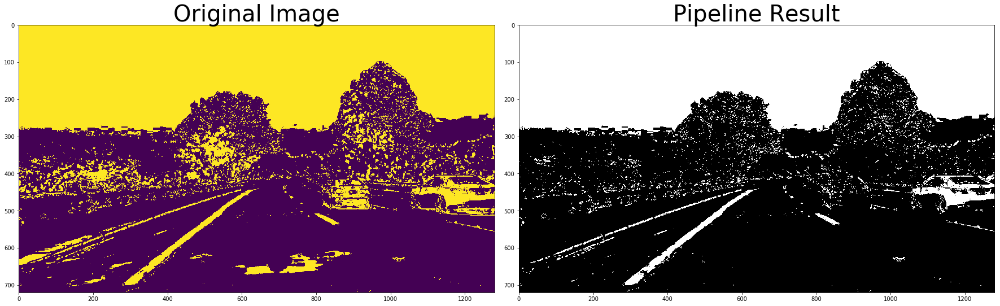

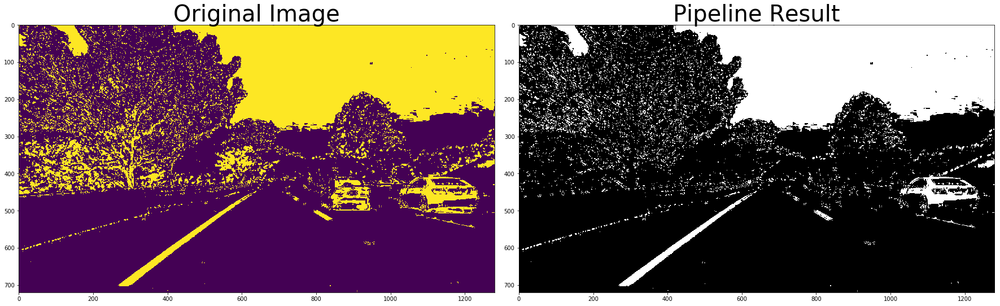

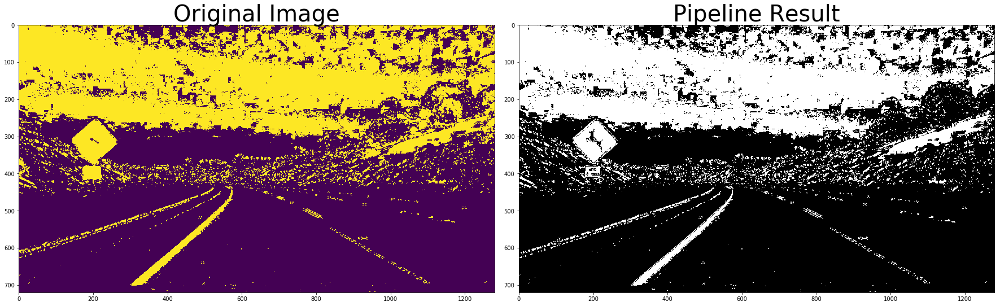

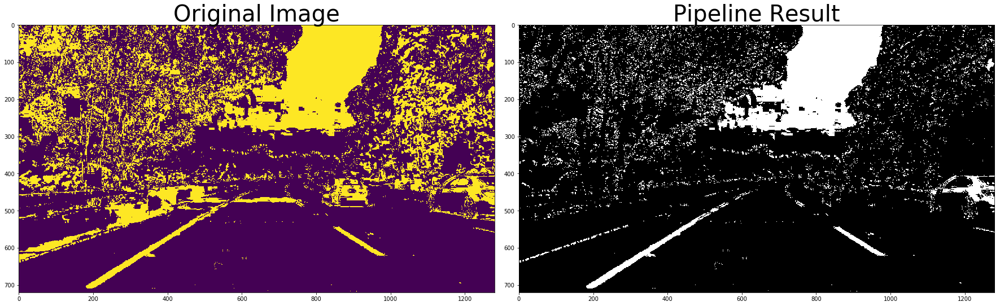

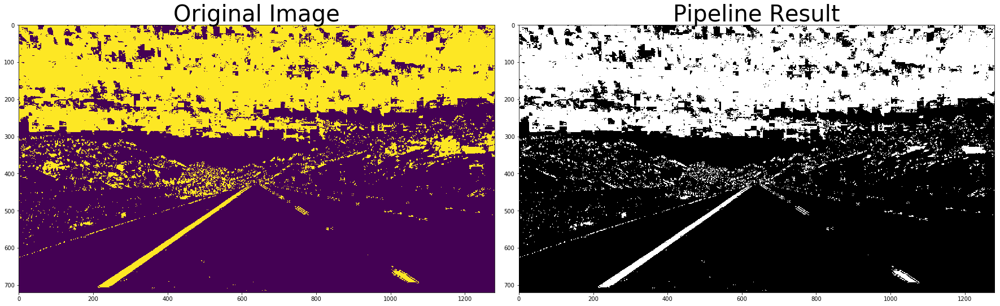

In [4]:
#cell block 4
#binary threshold testing combinations
for fname in dir_path:
    img = mpimg.imread("test_images/"+fname)
    undistorted = cal_undistort(img, mtx, dist)
    h=hls_select(undistorted,thresh=(100,255),channel=0)
    ll=hls_select(undistorted,thresh=(100,255),channel=1)
    s=hls_select(undistorted,thresh=(100,255),channel=2)
    binary_dir= dir_threshold(undistorted,thresh=(0.7,1.3),sobel_kernel=9)
    binary_mag= mag_threshold(undistorted,thresh=(20,100),sobel_kernel=9)
    binary_x= abs_sobel_thresh(undistorted,thresh=(20,100),sobel_kernel=9)
    color_binary,binary=binary_pipeline(undistorted)
    test=np.zeros_like(binary)
    test[((s==1)&(ll==1))|((binary_x==1)&(binary_dir==1))]=1
    #test[(s==1)&(binary_dir==1)]=1
    plot_img(binary,test)

In [5]:
#cell block 5
#fitting polynomials and radius of curvature
def fit_lane_lines(binary_warped,scale_x=1,scale_y=1):
    """
    This function takes 3 inputs: 
    binary_warped- a 1 channel binary image of lanes lines from a birds eye-view
    scale_x- a scale for x to return the radius of curvature in units other than pixels
    scale_y- a scale for y to return the radius of curvature in units other than pixels
    
    It returns:
    left_fit- the polynomial fit for the left lane
    right_fit- the polynomial fit for the right lane
    left_lane_inds- the indicies for the left lane pixels
    right_lane_inds- the indicies for the right lane pixels
    left_curve- the lane curvature for the left lane
    right_curve- the lane curvature for the right lane
    """
    # Take a histogram of the bottom half of the image
    y_eval=binary.shape[0]-50
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #calculate radius of curvature for polyfit
    right_curve=radius_curvature(righty,rightx,y_eval,scale_x,scale_y)
    left_curve=radius_curvature(lefty,leftx,y_eval,scale_x,scale_y)
    return left_fit, right_fit, left_lane_inds,right_lane_inds,left_curve,right_curve
    
def known_line_location_fit(binary_warped, left_fit,right_fit,scale_x=1,scale_y=1):
    """
    This function takes 3 inputs: 
    binary_warped- a 1 channel binary image of lanes lines from a birds eye-view
    left_fit- the left lane polynomial fit for the previous frame
    right_fit- the right lane polynomial fit for the previous frame
    scale_x- a scale for x to return the radius of curvature in units other than pixels
    scale_y- a scale for y to return the radius of curvature in units other than pixels
    
    It returns:
    left_fit- the polynomial fit for the left lane
    right_fit- the polynomial fit for the right lane
    left_lane_inds- the indicies for the left lane pixels
    right_lane_inds- the indicies for the right lane pixels
    left_curve- the lane curvature for the left lane
    right_curve- the lane curvature for the right lane
    """
    y_eval=binary.shape[0]-50
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    #calculate radius of curvature
    #calculate radius of curvature for polyfit
    right_curve=radius_curvature(righty,rightx,y_eval,scale_x,scale_y)
    left_curve=radius_curvature(lefty,leftx,y_eval,scale_x,scale_y)
    return left_fit, right_fit, left_lane_inds,right_lane_inds,left_curve,right_curve

def draw_known_fit_lines(binary_warped,left_fit,right_fit,left_lane_inds, right_lane_inds):
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    window_img = np.zeros_like(out_img)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1.0, 0.0, 0.0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0.0, 0.0, 1.0]
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

def radius_curvature(ploty,x,y_eval,scale_x=1,scale_y=1):
    fit_cr = np.polyfit(ploty*scale_y, x*scale_x, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*scale_y + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad

def img_text(img,text,coord,size=2,thickness=4):
    font= cv2.FONT_HERSHEY_SIMPLEX
    return cv2.putText(img,text,coord, font, size,(255,255,255),thickness,cv2.LINE_AA)

/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: divide by zero encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: invalid value encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in greater
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


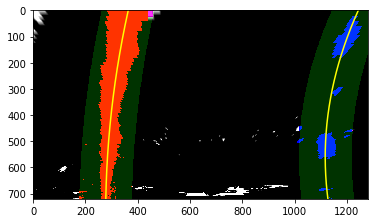

In [6]:
#cell block 6
#perspective transform
%matplotlib inline
offset=240
for fname in dir_path[3:4]:
    img = mpimg.imread("test_images/"+fname)
    undistorted = cal_undistort(img, mtx, dist)
    color_binary,binary=binary_pipeline(undistorted)
    img_size=binary.shape
    src=np.float32([[256,696],[1067,696],[585,457],[698,457]])
    dst=np.float32([[offset,img_size[0]],[img_size[1]-offset,img_size[0]],
                    [offset,0],[img_size[1]-offset,0]])
    M=cv2.getPerspectiveTransform(src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)
    warped=cv2.warpPerspective(binary,M,(img_size[1],img_size[0]))
    test= np.dstack((warped,warped,warped))
    plt.imshow(test)
    plt.savefig("output_images/binary_warped.jpg")
    #plt.show()
    #plot_img(undistorted,warped)
    left_lane, right_lane,left_lane_inds, right_lane_inds,left_curve,right_curve=fit_lane_lines(warped)
    draw_known_fit_lines(warped,left_lane,right_lane,left_lane_inds, right_lane_inds)

/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: divide by zero encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:41: RuntimeWarning: invalid value encountered in true_divide
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in greater
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less
/home/pepar/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


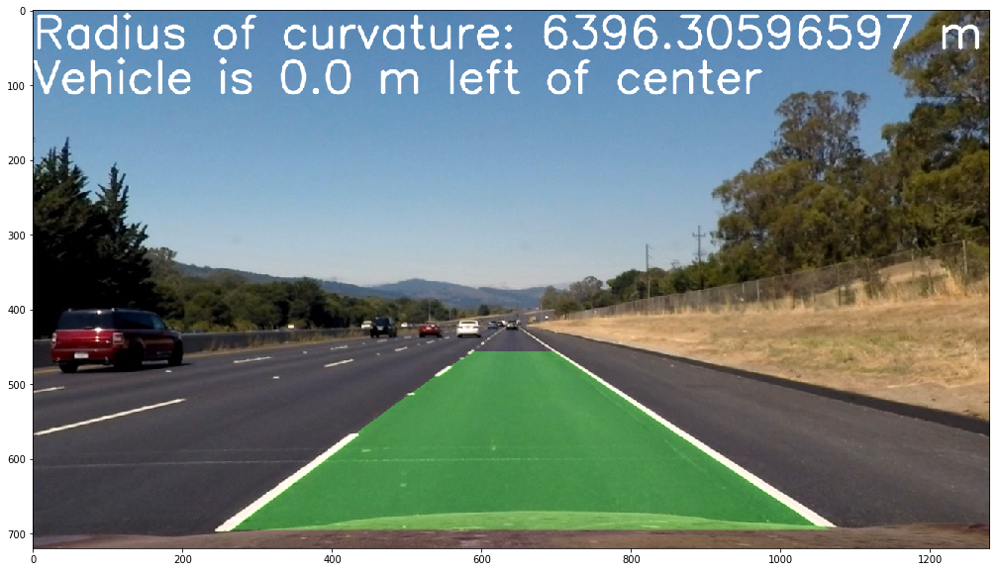

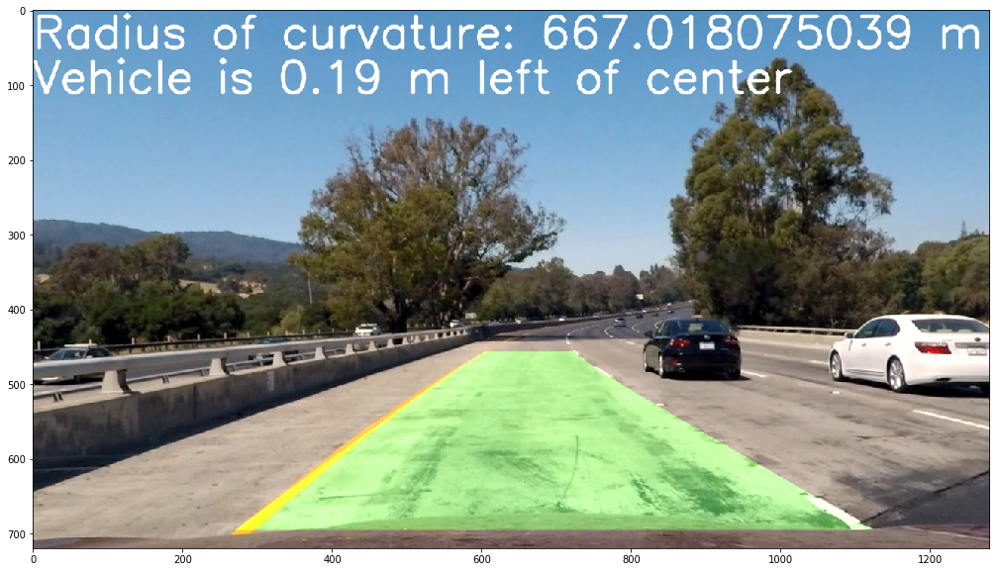

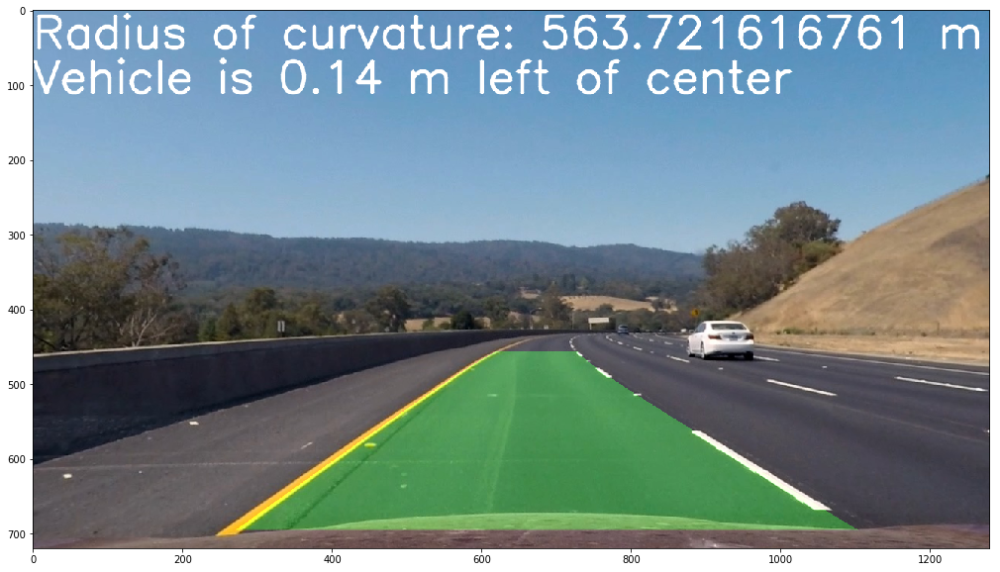

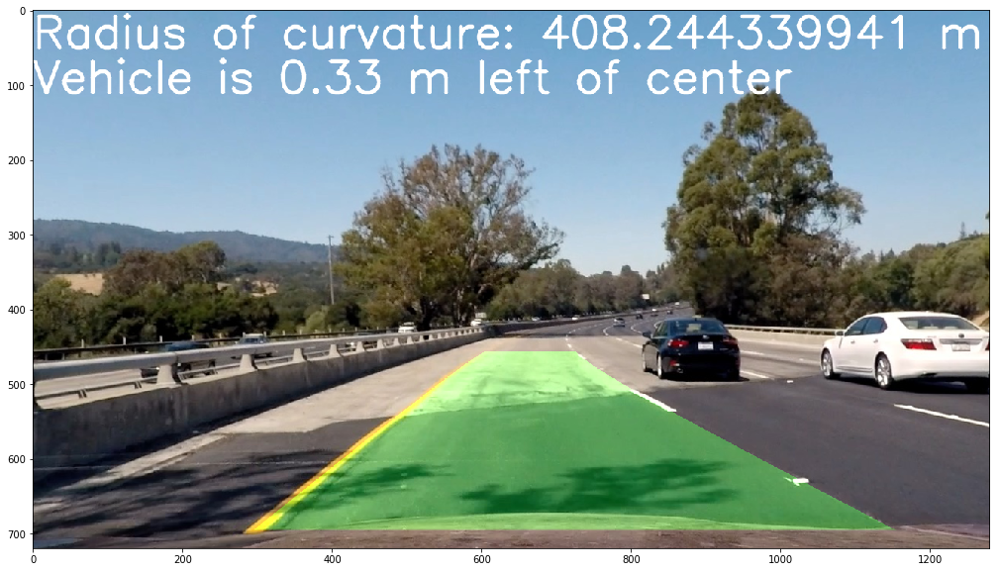

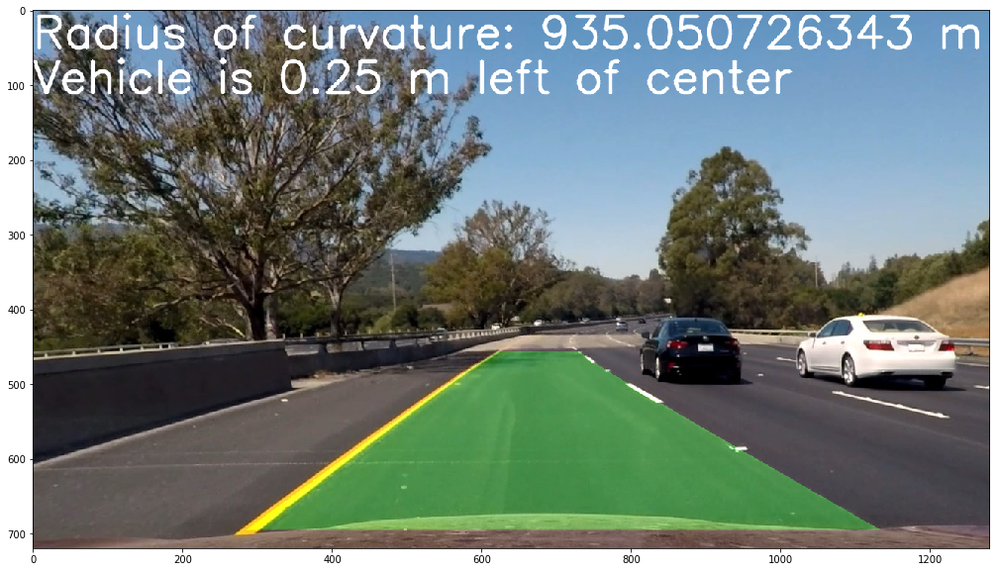

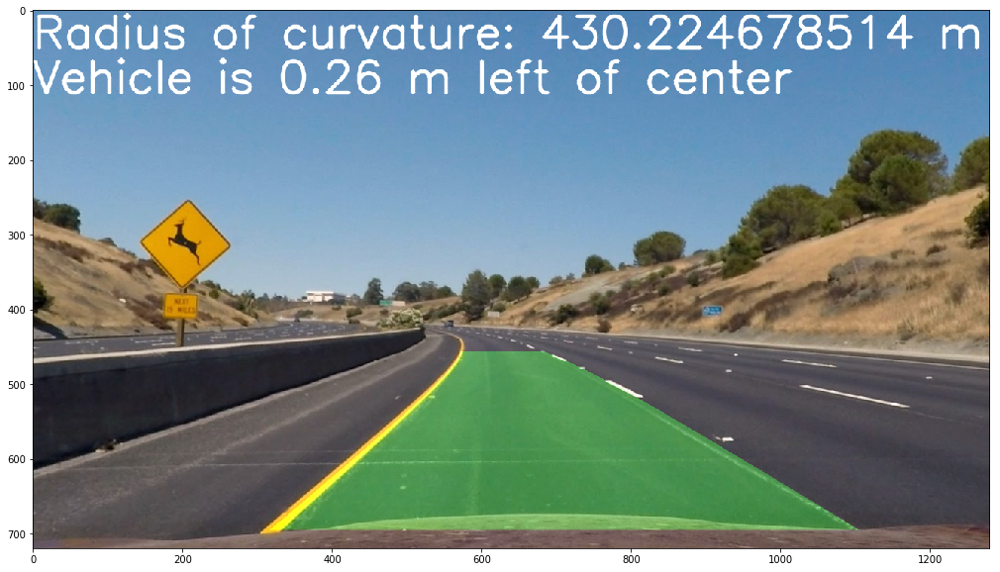

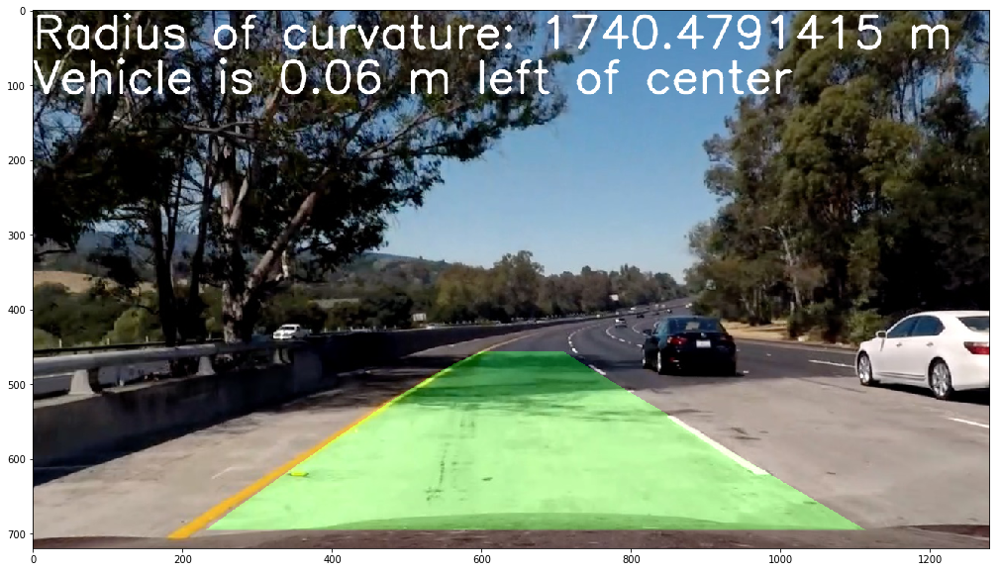

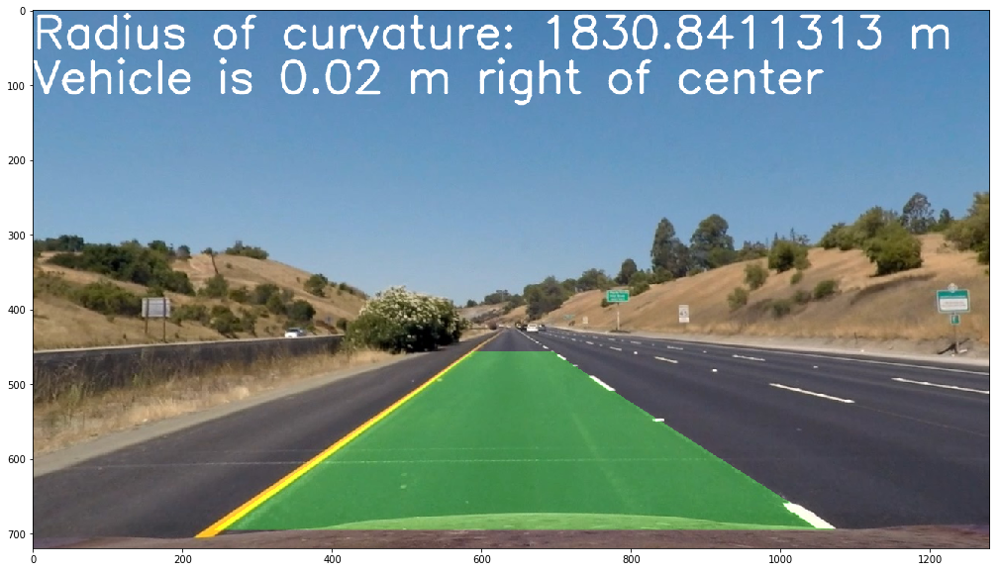

In [7]:
#cell block 7
#plot fitted polynomials, radius of curvature and vehicle measure from center of lane
%matplotlib inline
for fname in dir_path:
    img = mpimg.imread("test_images/"+fname)
    undistorted = cal_undistort(img, mtx, dist)
    color_binary,binary=binary_pipeline(undistorted)
    img_size=binary.shape
    img_mid_x=img_size[1]/2
    src=np.float32([[256,696],[1067,696],[585,457],[698,457]])
    #src=np.float32([[696,256],[696,1067],[457,585],[457,698]])
    dst=np.float32([[offset,img_size[0]],[img_size[1]-offset,img_size[0]],
                    [offset,0],[img_size[1]-offset,0]])
    M=cv2.getPerspectiveTransform(src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)
    warped=cv2.warpPerspective(binary,M,(img_size[1],img_size[0]))
    scale_y = 30/720 # meters per pixel in y dimension
    scale_x = 3.7/700
    #test= np.dstack((warped,warped,warped))
    #plt.imshow(test)
    #plt.show()
    #plot_img(undistorted,warped)
    left_fit, right_fit,left_lane_inds, right_lane_inds,left_curve,right_curve=fit_lane_lines(warped,scale_x,scale_y)
    #draw_known_fit_lines(warped,left_lane,right_lane,left_lane_inds, right_lane_inds)
    # Create an image to draw the lines on
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted.shape[1], undistorted.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    radius_text="Radius of curvature: %s m" %(right_curve)
    off_center=(float(img_mid_x)-((left_fit[0]*img_size[0]**2 + left_fit[1]*img_size[0] + left_fit[2])+
                          right_fit[0]*img_size[0]**2 + right_fit[1]*img_size[0] + right_fit[2])/2.0)*scale_x
    if off_center <0:
        center_text="Vehicle is %s m left of center"%(abs(round(off_center,2)))
    else:
        center_text="Vehicle is %s m right of center"%(abs(round(off_center,2)))
    result=img_text(result,radius_text,(0,50))
    result=img_text(result,center_text,(0,110))
    plt.figure(figsize=(20,10)) 
    plt.imshow(result)
    plt.show()

In [8]:
#cell block 8
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [9]:
#cell block 9
def video_process_lines(img):
    undistorted = cal_undistort(img, mtx, dist)
    color_binary,binary=binary_pipeline(undistorted)
    img_size=binary.shape
    img_mid_x=img_size[1]/2
    src=np.float32([[256,696],[1067,696],[585,457],[698,457]])
    #src=np.float32([[696,256],[696,1067],[457,585],[457,698]])
    dst=np.float32([[offset,img_size[0]],[img_size[1]-offset,img_size[0]],
                    [offset,0],[img_size[1]-offset,0]])
    M=cv2.getPerspectiveTransform(src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)
    warped=cv2.warpPerspective(binary,M,(img_size[1],img_size[0]))
    #test= np.dstack((warped,warped,warped))
    #plt.imshow(test)
    #plt.show()
    #plot_img(undistorted,warped)
    left_fit=left_fit_list[-1]
    right_fit=right_fit_list[-1]
    scale_y = 30/720 # meters per pixel in y dimension
    scale_x = 3.7/700
    if left_fit is None:
        left_fit,right_fit,left_lane_inds,right_lane_inds,left_curve,right_curve=fit_lane_lines(warped,scale_x,scale_y)
    else:
        left_fit,right_fit,left_lane_inds,right_lane_inds,left_curve,right_curve=known_line_location_fit(warped,left_fit,right_fit,scale_x,scale_y)
    left_fit_list.append(left_fit)
    right_fit_list.append(right_fit)
    left_curve_list.append(left_curve)
    right_curve_list.append(right_curve)
    
    #draw_known_fit_lines(warped,left_lane,right_lane,left_lane_inds, right_lane_inds)
    # Create an image to draw the lines on
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    left_warp_zero=warp_zero.copy()
    right_warp_zero=warp_zero.copy()
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_warp_zero[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255]
    right_warp_zero[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255]
    color_warp = np.dstack((left_warp_zero, warp_zero, right_warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    #plt.imshow(color_warp)
    #plt.show()
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted.shape[1], undistorted.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    radius_text="Radius of curvature: %s m" %(int(round((sum(right_curve_list[-3:])/len(right_curve_list[-3:])+sum(left_curve_list[-3:])/len(left_curve_list[-3:]))/2.0,0)))
    off_center=(float(img_mid_x)-((left_fit[0]*img_size[0]**2 + left_fit[1]*img_size[0] + left_fit[2])+
                          right_fit[0]*img_size[0]**2 + right_fit[1]*img_size[0] + right_fit[2])/2.0)*scale_x
    if off_center <0:
        center_text="Vehicle is %s m left of center"%(abs(round(off_center,2)))
    else:
        center_text="Vehicle is %s m right of center"%(abs(round(off_center,2)))
    result=img_text(result,radius_text,(0,50))
    result=img_text(result,center_text,(0,110))
    return result

In [10]:
#cell block 10
#video processing
left_fit_list=[None]
right_fit_list=[None]
left_curve_list=[]
right_curve_list=[]
white_output = 'test.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(video_process_lines) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4


100%|█████████▉| 1260/1261 [06:49<00:00,  3.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test.mp4 

CPU times: user 7min 49s, sys: 4.22 s, total: 7min 53s
Wall time: 6min 51s


In [ ]:
#cell block 11
#output processed video
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [ ]:
#cell block 12
#test video processing on test images
%matplotlib inline
left_fit_list=[None]
right_fit_list=[None]
left_curve_list=[]
right_curve_list=[]
for fname in dir_path[0:1]:
    img = mpimg.imread("test_images/"+fname)
    result=video_process_lines(img)
    plt.figure(figsize=(20,10)) 
    plt.imshow(result)
    plt.show()
